### Notebook to identify and visualise gene markers for Epithelial cells 

- **Developed by**: Carlos Talavera-López Ph.D
- **Institute of Computational Biology - Computational Health Centre - Helmholtz Munich**
- v230223

### Import required modules

In [1]:
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from bioservices import KEGG
import matplotlib.pyplot as plt

### Set up working environment

In [2]:
sc.settings.verbosity = 1
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.2
scanpy      1.9.5
-----
PIL                 10.0.0
appdirs             1.4.4
asttokens           NA
attr                23.1.0
backcall            0.2.0
bioservices         1.11.2
bs4                 4.12.2
cattr               NA
cattrs              NA
certifi             2023.07.22
charset_normalizer  3.2.0
colorama            0.4.6
colorlog            NA
comm                0.1.4
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.7.post1
decorator           5.1.1
easydev             0.12.1
exceptiongroup      1.1.3
executing           1.2.0
h5py                3.9.0
idna                3.4
igraph              0.10.8
importlib_resources NA
ipykernel           6.25.1
ipywidgets          8.1.0
jedi                0.19.0
joblib              1.3.2
kiwisolver          1.4.5
llvmlite            0.40.1
louvain             0.8.1
lxml                4.9.3
matplotlib          3.7.2
mpl_toolkits        NA
msgpack          

### Read in Healthy-CTRL dataset

In [3]:
BrEpit_ALL = sc.read_h5ad('../data/Marburg_cell_states_locked_scANVI_ctl230901.raw.h5ad') 
BrEpit_ALL

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', 'seed_labels', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'mt', 'ribo'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

### Visualise manifold with `scANVI` annotation

/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:12

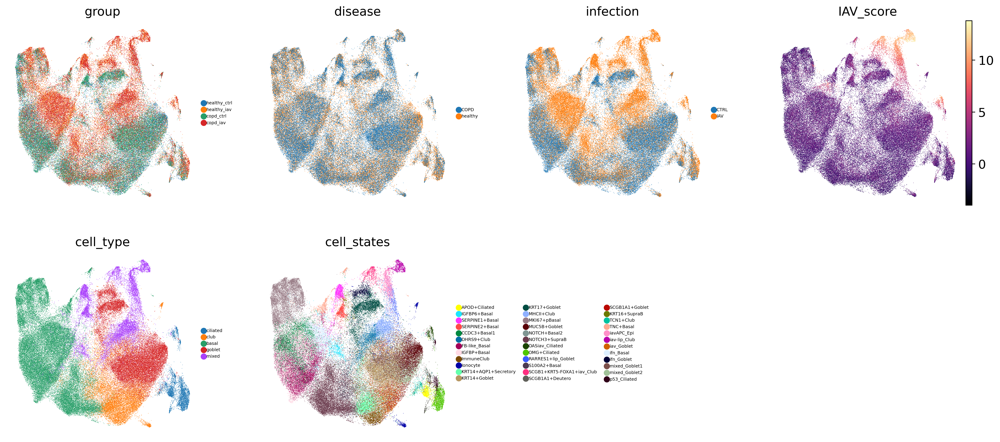

In [4]:
sc.pl.umap(BrEpit_ALL, frameon = False, color = ['group', 'disease', 'infection', 'IAV_score', 'cell_type', 'cell_states'], size = 1, legend_fontsize = 5, ncols = 4)

/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:12

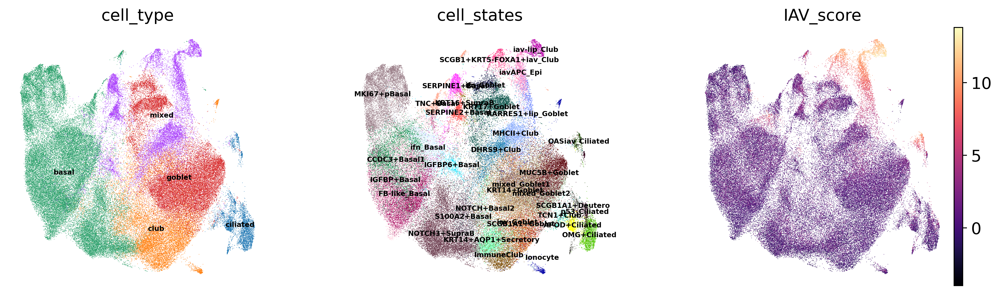

In [5]:
sc.pl.umap(BrEpit_ALL, frameon = False, color = ['cell_type', 'cell_states', 'IAV_score'], size = 0.8, legend_fontsize = 6, ncols = 4, legend_loc = 'on data')

### Calculate marker genes 

In [6]:
adata_log = anndata.AnnData(X = BrEpit_ALL.X,  var = BrEpit_ALL.var, obs = BrEpit_ALL.obs, obsm = BrEpit_ALL.obsm)
sc.pp.normalize_total(adata_log, target_sum = 1e6, exclude_highly_expressed = True)
sc.pp.log1p(adata_log)
adata_log.layers["sqrt_norm"] = np.sqrt(
    sc.pp.normalize_total(adata_log, inplace = False)["X"]
)

### Visualise marker genes for senescense

In [ ]:
adata_log.obs['cell_states'].cat.categories

In [7]:
markers = ['ACVR1B', 'ANG', 'ANGPT1', 'ANGPTL4', 'AREG', 'AXL', 'BEX3', 'BMP2', 'BMP6', 'C3', 'CCL16', 'CCL2', 'CCL20', 'CCL26', 'CCL3', 'CCL4', 'CCL5', 'CCL8', 'CD55', 'CD9', 'CSF1', 'CSF2', 'CST4', 'CTNNB1', 'CTSB', 'CXCL1', 'CXCL10', 'CXCL12', 'CXCL16', 'CXCL2', 'CXCL3', 'CXCL8', 'CXCR2', 'DKK1', 'EDN1', 'EGF', 'EGFR', 'EREG', 'ESM1', 'ETS2', 'FAS', 'FGF1', 'FGF2', 'FGF7', 'GDF15', 'GEM', 'GMFG', 'HGF', 'HMGB1', 'ICAM1', 'ICAM3', 'IGF1', 'IGFBP1', 'IGFBP2', 'IGFBP3', 'IGFBP4', 'IGFBP5', 'IGFBP6', 'IGFBP7', 'IL10', 'IL13', 'IL15']
sc.pl.stacked_violin(adata_log, markers, groupby = 'cell_states', dendrogram = True, cmap = 'magma')

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_dendrogram.py:105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(adata.obs[group]):
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [ ]:
mayo_list = ['ACVR1B', 'ANG', 'ANGPT1', 'ANGPTL4', 'AREG', 'AXL', 'BEX3', 'BMP2', 'BMP6', 'C3', 'CCL16', 'CCL2', 'CCL20', 'CCL26', 'CCL3', 'CCL4', 'CCL5', 'CCL8', 'CD55', 'CD9', 'CSF1', 'CSF2', 'CST4', 'CTNNB1', 'CTSB', 'CXCL1', 'CXCL10', 'CXCL12', 'CXCL16', 'CXCL2', 'CXCL3', 'CXCL8', 'CXCR2', 'DKK1', 'EDN1', 'EGF', 'EGFR', 'EREG', 'ESM1', 'ETS2', 'FAS', 'FGF1', 'FGF2', 'FGF7', 'GDF15', 'GEM', 'GMFG', 'HGF', 'HMGB1', 'ICAM1', 'ICAM3', 'IGF1', 'IGFBP1', 'IGFBP2', 'IGFBP3', 'IGFBP4', 'IGFBP5', 'IGFBP6', 'IGFBP7', 'IL10', 'IL13', 'IL15']
sc.tl.score_genes(BrEpit_ALL, mayo_list, score_name = 'Mayo_list_Score', use_raw = False)
adata_log.obs['Mayo_list_Score'] = BrEpit_ALL.obs['Mayo_list_Score'].copy()
sc.pl.umap(adata_log, frameon = False, color = ['disease', 'infection', 'IAV_score', 'Mayo_list_Score', 'cell_states'], size = 0.7, legend_fontsize = 5, ncols = 3, layer = 'sqrt_norm', cmap = 'magma')

In [ ]:
sc.pl.umap(adata_log, frameon = False, color = ['disease', 'infection', 'IAV_score', 'Mayo_list_Score', 'cell_type'], size = 0.7, legend_fontsize = 5, ncols = 3, layer = 'sqrt_norm', cmap = 'magma')

In [ ]:
sc.pl.dotplot(adata_log, markers, groupby = 'leiden_states', layer = 'sqrt_norm', cmap = 'magma')

In [ ]:
sc.pl.umap(adata_log, frameon = False, color = ['leiden_states', 'IAV_score', 'KRT5', 'KRT17', 'ACTB', 'SCGB1A1'], size = 0.5, legend_fontsize = 5, ncols = 3, legend_loc = 'on data', layer = 'sqrt_norm', cmap = 'magma')

In [ ]:
markers = ['SERPINE1', 'SERPINE2', 'PMEPA1', 'AMIGO2', 'LGALS1', 'MYL9', 'DKK3', 'MMP2']
sc.pl.stacked_violin(adata_log, markers, groupby = 'group', dendrogram = True, cmap = 'RdPu')

In [ ]:
markers = ['TWIST1', 'FOXC2', 'SNAI1', 'VIM', 'FGFR1']
sc.pl.stacked_violin(adata_log, markers, groupby = 'group', dendrogram = True, cmap = 'RdPu')

In [ ]:
markers = ['TWIST1', 'FOXC2', 'SNAI1', 'VIM', 'FGFR1']
sc.pl.stacked_violin(adata_log, markers, groupby = 'disease', dendrogram = True, cmap = 'RdPu')

In [ ]:
markers = ['TWIST1', 'FOXC2', 'SNAI1', 'VIM', 'FGFR1']
sc.pl.stacked_violin(adata_log, markers, groupby = 'infection', dendrogram = True, cmap = 'RdPu')

In [ ]:
markers = ['TWIST1', 'FOXC2', 'SNAI1', 'VIM', 'FGFR1', 'FN1']
sc.pl.stacked_violin(adata_log, markers, groupby = 'leiden_states', dendrogram = True, cmap = 'RdPu')

### Calculate expression scores

- KEGG Influenza A signature

In [ ]:
kegg = KEGG()
pathway = kegg.get('hsa05164')
genes = kegg.parse(pathway)

gene_list = [desc.split(';')[0] for desc in genes['GENE'].values()]
gene_list

In [ ]:
sc.tl.score_genes(BrEpit_ALL, gene_list, score_name = 'KEGG-IAV_Score', use_raw = False)
adata_log.obs['KEGG-IAV_Score'] = BrEpit_ALL.obs['KEGG-IAV_Score'].copy()
sc.pl.umap(adata_log, frameon = False, color = ['leiden_states', 'IAV_score', 'KEGG-IAV_Score'], size = 0.5, legend_fontsize = 5, ncols = 3, legend_loc = 'on data', layer = 'sqrt_norm', cmap = 'magma')

- KEGG Interferon alpha

In [ ]:
kegg = KEGG()
pathway = kegg.get('hsa04630')
genes = kegg.parse(pathway)

gene_list = [desc.split(';')[0] for desc in genes['GENE'].values()]
gene_list

In [ ]:
sc.tl.score_genes(BrEpit_ALL, gene_list, score_name = 'IFNab_Score', use_raw = False)
adata_log.obs['IFNab_Score'] = BrEpit_ALL.obs['IFNab_Score'].copy()
sc.pl.umap(adata_log, frameon = False, color = ['leiden_states', 'IAV_score', 'KEGG-IAV_Score', 'IFNab_Score'], size = 0.5, legend_fontsize = 5, ncols = 3, legend_loc = 'on data', layer = 'sqrt_norm', cmap = 'magma')

- KEGG interferon gamma

In [ ]:
kegg = KEGG()
pathway = kegg.get('hsa04622')
genes = kegg.parse(pathway)

gene_list = [desc.split(';')[0] for desc in genes['GENE'].values()]
gene_list

In [ ]:
sc.tl.score_genes(BrEpit_ALL, gene_list, score_name = 'IFNg_Score', use_raw = False)
adata_log.obs['IFNg_Score'] = BrEpit_ALL.obs['IFNg_Score'].copy()
sc.pl.umap(adata_log, frameon = False, color = ['leiden_states', 'IAV_score', 'KEGG-IAV_Score', 'IFNab_Score', 'IFNg_Score'], size = 0.5, legend_fontsize = 5, ncols = 3, legend_loc = 'on data', layer = 'sqrt_norm', cmap = 'magma')

- KEGG IL-1

In [ ]:
kegg = KEGG()
pathway = kegg.get('hsa04668')
genes = kegg.parse(pathway)

gene_list = [desc.split(';')[0] for desc in genes['GENE'].values()]
gene_list

In [ ]:
sc.tl.score_genes(BrEpit_ALL, gene_list, score_name = 'IL1_Score', use_raw = False)
adata_log.obs['IL1_Score'] = BrEpit_ALL.obs['IL1_Score'].copy()
sc.pl.umap(adata_log, frameon = False, color = ['leiden_states', 'IAV_score', 'KEGG-IAV_Score', 'IFNab_Score', 'IFNg_Score', 'IL1_Score'], size = 0.5, legend_fontsize = 5, ncols = 3, legend_loc = 'on data', layer = 'sqrt_norm', cmap = 'magma')

### Calculate cluster-specific marker genes using _Wilcoxon's Rank Sum Test_

In [ ]:
sc.tl.rank_genes_groups(adata_log, 'leiden_states', method = 'wilcoxon', n_genes = 100, use_raw = False)
result = adata_log.uns['rank_genes_groups']
groups = result['names'].dtype.names
wilcox_markers = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges', 'pvals_adj']})
wilcox_markers.head(10)

### Visualise marker genes

In [ ]:
sc.pl.rank_genes_groups_dotplot(adata_log, n_genes = 5, cmap = 'magma')

### Calculate marker genes per condition

- Split dataset by condition

In [ ]:
healthy_ctrl_log = adata_log[adata_log.obs['group'].isin(['healthy_ctrl'])]
healthy_ctrl_log 

In [ ]:
sc.tl.rank_genes_groups(healthy_ctrl_log, 'leiden_states', method = 'wilcoxon', n_genes = healthy_ctrl_log.shape[1], use_raw = False)
result = healthy_ctrl_log.uns['rank_genes_groups']
groups = result['names'].dtype.names
wilcox_markers = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges', 'pvals_adj']})
wilcox_markers.head(10)

In [ ]:
sc.pl.rank_genes_groups_dotplot(healthy_ctrl_log, n_genes = 5, values_to_plot = 'scores', cmap = 'coolwarm')

In [ ]:
sc.pl.rank_genes_groups_dotplot(healthy_ctrl_log, n_genes = 5, values_to_plot = 'logfoldchanges', cmap = 'coolwarm')

In [ ]:
healthy_iav_log = adata_log[adata_log.obs['group'].isin(['healthy_iav'])]
healthy_iav_log 

In [ ]:
sc.tl.rank_genes_groups(healthy_iav_log, 'leiden_states', method = 'wilcoxon', n_genes = healthy_iav_log.shape[1], use_raw = False)
result = healthy_iav_log.uns['rank_genes_groups']
groups = result['names'].dtype.names
wilcox_markers = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges', 'pvals_adj']})
wilcox_markers.head(10)

In [ ]:
sc.pl.rank_genes_groups_dotplot(healthy_iav_log, n_genes = 5, values_to_plot = 'scores', cmap = 'coolwarm')

In [ ]:
sc.pl.rank_genes_groups_dotplot(healthy_iav_log, n_genes = 5, values_to_plot = 'logfoldchanges', cmap = 'coolwarm')

In [ ]:
copd_ctrl_log = adata_log[adata_log.obs['group'].isin(['copd_ctrl'])]
copd_ctrl_log 

In [ ]:
sc.tl.rank_genes_groups(copd_ctrl_log, 'leiden_states', method = 'wilcoxon', n_genes = healthy_iav_log.shape[1], use_raw = False)
result = copd_ctrl_log.uns['rank_genes_groups']
groups = result['names'].dtype.names
wilcox_markers = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges', 'pvals_adj']})
wilcox_markers.head(10)

In [ ]:
sc.pl.rank_genes_groups_dotplot(copd_ctrl_log, n_genes = 5, values_to_plot = 'scores', cmap = 'coolwarm')

In [ ]:
sc.pl.rank_genes_groups_dotplot(copd_ctrl_log, n_genes = 5, values_to_plot = 'logfoldchanges', cmap = 'coolwarm')

In [ ]:
copd_iav_log = adata_log[adata_log.obs['group'].isin(['copd_iav'])]
copd_iav_log 

In [ ]:
sc.tl.rank_genes_groups(copd_iav_log, 'leiden_states', method = 'wilcoxon', n_genes = healthy_iav_log.shape[1], use_raw = False)
result = copd_iav_log.uns['rank_genes_groups']
groups = result['names'].dtype.names
wilcox_markers = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges', 'pvals_adj']})
wilcox_markers.head(10)

In [ ]:
sc.pl.rank_genes_groups_dotplot(copd_iav_log, n_genes = 5, values_to_plot = 'scores', cmap = 'coolwarm')

In [ ]:
sc.pl.rank_genes_groups_dotplot(copd_iav_log, n_genes = 5, values_to_plot = 'logfoldchanges', cmap = 'coolwarm')

### Export annotated object

In [ ]:
BrEpit_ALL

In [ ]:
sc.pl.umap(BrEpit_ALL, frameon = False, color = ['leiden_states', 'STEAP4', 'CEP55', 'FOXJ1', 'PIGR', 'SERPINE2', 'ADM2', 'WNT10A'], size = 1, legend_fontsize = 5, ncols = 4, legend_loc = 'on data')